# Time/Domain Detector Probe (CustomCNN variants)

Goal: stress-test the dataset/model for leakage by proving the CustomCNN behaves like a "time detector" rather than a damage detector.
Experiments:
1) **Intact post-event test**: feed an intact post-hurricane tile; a time detector will still predict damage.
2) **Shuffle control**: train a pixel-shuffled variant; if accuracy stays high, the model is using global color stats only.
3) **Grad-CAM**: visualize focus; a time detector yields diffuse/background heatmaps.


In [ ]:
from __future__ import annotations
from pathlib import Path
import sys
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

sns.set_theme(style='whitegrid', palette='colorblind')
plt.rcParams.update({'figure.dpi': 200, 'savefig.dpi': 200})

# Project paths and imports

def resolve_project_root() -> Path:
    root = Path.cwd().resolve()
    if (root / 'src').exists():
        return root
    if root.name == 'notebooks' and (root.parent / 'src').exists():
        return root.parent.resolve()
    for parent in root.parents:
        if (parent / 'src').exists():
            return parent.resolve()
    return root

PROJECT_ROOT = resolve_project_root()
sys.path.append(str(PROJECT_ROOT / 'src'))

from config import TrainConfig
from training.trainer import Trainer
from models import build_model
from models.custom_time_detector import CustomTimeDetector
from data.transforms import build_transforms

DATA_ROOT = PROJECT_ROOT / 'data'  # use raw splits to expose leakage
DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
SEED = 42

print('Project root:', PROJECT_ROOT)
print('Device:', DEVICE)

Project root: /home/tim/repos/ipeo-hurricane-damage-detection
Device: cuda


In [12]:
# Helpers: transforms, loading, Grad-CAM
def make_eval_transform(cfg: TrainConfig):
    tfms = build_transforms(cfg, train=False)
    return tfms

def load_image_tensor(path: Path, tfm) -> torch.Tensor:
    from PIL import Image
    img = Image.open(path).convert('RGB')
    return tfm(img)

def load_model_from_ckpt(cfg: TrainConfig, ckpt_path: Path):
    state = torch.load(ckpt_path, map_location=DEVICE)
    model = build_model(cfg)
    model.load_state_dict(state['model_state'])
    model.to(DEVICE).eval()
    return model

def grad_cam_heatmap(model: CustomTimeDetector, image: torch.Tensor, class_idx: int):
    model.zero_grad(set_to_none=True)
    logits = model(image.unsqueeze(0).to(DEVICE))
    score = logits[0, class_idx]
    score.backward()
    feats = model.get_cam_features()
    grads = model.get_cam_grads()
    if feats is None or grads is None:
        raise RuntimeError('Grad-CAM buffers not captured.')
    weights = grads.mean(dim=(2, 3), keepdim=True)
    cam = (weights * feats).sum(dim=1, keepdim=True)
    cam = F.relu(cam)
    cam = F.interpolate(cam, size=image.shape[1:], mode='bilinear', align_corners=False)
    cam = cam[0, 0]
    cam = (cam - cam.min()) / (cam.max() + 1e-6)
    return cam.detach().cpu(), logits.softmax(dim=1).detach().cpu()[0]

def show_cam_on_image(img_tensor: torch.Tensor, cam: torch.Tensor, title: str = ''):
    img_np = img_tensor.permute(1, 2, 0).cpu().numpy()
    img_np = (img_np - img_np.min()) / (img_np.max() + 1e-6)
    img_np = np.clip(img_np, 0, 1)
    cam_np = cam.numpy()
    fig, axes = plt.subplots(1, 2, figsize=(10, 4))
    axes[0].imshow(img_np)
    axes[0].set_title('Input')
    axes[0].axis('off')
    axes[1].imshow(img_np)
    axes[1].imshow(cam_np, cmap='jet', alpha=0.4)
    axes[1].set_title(title)
    axes[1].axis('off')
    plt.tight_layout()
    return fig

## Train baseline CustomTimeDetector (no shuffle)


In [3]:
base_cfg = TrainConfig(
    data_root=str(DATA_ROOT),
    model_name='custom_time_detector',
    pretrained=False,
    epochs=20,
    batch_size=64,
    lr=3e-4,
    dropout=0.2,
    custom_shuffle_pixels=False,
    custom_pointwise_conv=False,
    checkpoints_dir=str(PROJECT_ROOT / 'training_runs/time_detector_base/checkpoints'),
    tensorboard=False,
    wandb_mode='disabled',
    amp=False,
    progress_bar=True,
)

base_trainer = Trainer(base_cfg)
base_train_stats = base_trainer.fit()
base_test_metrics = base_trainer.test()
base_ckpt = Path(base_cfg.checkpoints_dir) / 'best.pt'
base_ckpt

Epoch 1/20:   0%|          | 0/296 [00:00<?, ?it/s]

2025-12-09 21:18:27,670 | INFO | Epoch 000 | train_loss=0.3710 | val_loss=0.5672 | val_f1=0.782


Epoch 2/20:   0%|          | 0/296 [00:00<?, ?it/s]

2025-12-09 21:18:46,293 | INFO | Epoch 001 | train_loss=0.2852 | val_loss=0.6390 | val_f1=0.545


Epoch 3/20:   0%|          | 0/296 [00:00<?, ?it/s]

2025-12-09 21:19:04,623 | INFO | Epoch 002 | train_loss=0.2597 | val_loss=0.5707 | val_f1=0.666


Epoch 4/20:   0%|          | 0/296 [00:00<?, ?it/s]

2025-12-09 21:19:23,540 | INFO | Epoch 003 | train_loss=0.2429 | val_loss=0.6154 | val_f1=0.638


Epoch 5/20:   0%|          | 0/296 [00:00<?, ?it/s]

2025-12-09 21:19:42,048 | INFO | Epoch 004 | train_loss=0.2350 | val_loss=0.5284 | val_f1=0.756


Epoch 6/20:   0%|          | 0/296 [00:00<?, ?it/s]

2025-12-09 21:20:00,459 | INFO | Epoch 005 | train_loss=0.2312 | val_loss=0.6687 | val_f1=0.630


Epoch 7/20:   0%|          | 0/296 [00:00<?, ?it/s]

2025-12-09 21:20:19,056 | INFO | Epoch 006 | train_loss=0.2251 | val_loss=0.4814 | val_f1=0.832


Epoch 8/20:   0%|          | 0/296 [00:00<?, ?it/s]

2025-12-09 21:20:38,226 | INFO | Epoch 007 | train_loss=0.2201 | val_loss=0.4956 | val_f1=0.827


Epoch 9/20:   0%|          | 0/296 [00:00<?, ?it/s]

2025-12-09 21:20:56,668 | INFO | Epoch 008 | train_loss=0.2152 | val_loss=0.4619 | val_f1=0.857


Epoch 10/20:   0%|          | 0/296 [00:00<?, ?it/s]

2025-12-09 21:21:15,222 | INFO | Epoch 009 | train_loss=0.2137 | val_loss=0.4892 | val_f1=0.733


Epoch 11/20:   0%|          | 0/296 [00:00<?, ?it/s]

2025-12-09 21:21:34,183 | INFO | Epoch 010 | train_loss=0.2015 | val_loss=0.4371 | val_f1=0.861


Epoch 12/20:   0%|          | 0/296 [00:00<?, ?it/s]

2025-12-09 21:21:52,700 | INFO | Epoch 011 | train_loss=0.2057 | val_loss=0.3849 | val_f1=0.877


Epoch 13/20:   0%|          | 0/296 [00:00<?, ?it/s]

2025-12-09 21:22:11,372 | INFO | Epoch 012 | train_loss=0.1984 | val_loss=0.4282 | val_f1=0.812


Epoch 14/20:   0%|          | 0/296 [00:00<?, ?it/s]

2025-12-09 21:22:29,950 | INFO | Epoch 013 | train_loss=0.1955 | val_loss=0.3920 | val_f1=0.866


Epoch 15/20:   0%|          | 0/296 [00:00<?, ?it/s]

2025-12-09 21:22:48,894 | INFO | Epoch 014 | train_loss=0.1921 | val_loss=0.4125 | val_f1=0.872


Epoch 16/20:   0%|          | 0/296 [00:00<?, ?it/s]

2025-12-09 21:23:07,832 | INFO | Epoch 015 | train_loss=0.1947 | val_loss=0.3823 | val_f1=0.858


Epoch 17/20:   0%|          | 0/296 [00:00<?, ?it/s]

2025-12-09 21:23:26,143 | INFO | Epoch 016 | train_loss=0.1929 | val_loss=0.3936 | val_f1=0.857


Epoch 18/20:   0%|          | 0/296 [00:00<?, ?it/s]

2025-12-09 21:23:44,913 | INFO | Epoch 017 | train_loss=0.1912 | val_loss=0.3904 | val_f1=0.862


Epoch 19/20:   0%|          | 0/296 [00:00<?, ?it/s]

2025-12-09 21:24:03,753 | INFO | Epoch 018 | train_loss=0.1879 | val_loss=0.4037 | val_f1=0.844


Epoch 20/20:   0%|          | 0/296 [00:00<?, ?it/s]

2025-12-09 21:24:22,120 | INFO | Epoch 019 | train_loss=0.1889 | val_loss=0.4051 | val_f1=0.840


PosixPath('/home/tim/repos/ipeo-hurricane-damage-detection/training_runs/time_detector_base/checkpoints/best.pt')

## Train shuffled CustomTimeDetector (pixel shuffle control)


In [4]:
shuffle_cfg = TrainConfig(
    data_root=str(DATA_ROOT),
    model_name='custom_time_detector',
    pretrained=False,
    epochs=20,
    batch_size=64,
    lr=3e-4,
    dropout=0.2,
    custom_shuffle_pixels=True,   # randomly shuffles pixels within each image (but keeps color channels aligned)
    custom_pointwise_conv=False, # swap 3x3 for 1x1 conv to destroy spatial cues
    checkpoints_dir=str(PROJECT_ROOT / 'training_runs/time_detector_shuffle/checkpoints'),
    tensorboard=False,
    wandb_mode='disabled',
    amp=False,
    progress_bar=True,
)
shuffle_trainer = Trainer(shuffle_cfg)
shuffle_train_stats = shuffle_trainer.fit()
shuffle_test_metrics = shuffle_trainer.test()
shuffle_ckpt = Path(shuffle_cfg.checkpoints_dir) / 'best.pt'
shuffle_ckpt

Epoch 1/20:   0%|          | 0/296 [00:00<?, ?it/s]

2025-12-09 21:24:41,797 | INFO | Epoch 000 | train_loss=0.6022 | val_loss=0.5494 | val_f1=0.749


Epoch 2/20:   0%|          | 0/296 [00:00<?, ?it/s]

2025-12-09 21:25:00,075 | INFO | Epoch 001 | train_loss=0.5594 | val_loss=0.5248 | val_f1=0.767


Epoch 3/20:   0%|          | 0/296 [00:00<?, ?it/s]

2025-12-09 21:25:18,684 | INFO | Epoch 002 | train_loss=0.5286 | val_loss=0.6273 | val_f1=0.628


Epoch 4/20:   0%|          | 0/296 [00:00<?, ?it/s]

2025-12-09 21:25:36,930 | INFO | Epoch 003 | train_loss=0.5163 | val_loss=0.6114 | val_f1=0.633


Epoch 5/20:   0%|          | 0/296 [00:00<?, ?it/s]

2025-12-09 21:25:55,136 | INFO | Epoch 004 | train_loss=0.5055 | val_loss=0.6651 | val_f1=0.601


Epoch 6/20:   0%|          | 0/296 [00:00<?, ?it/s]

2025-12-09 21:26:14,401 | INFO | Epoch 005 | train_loss=0.4988 | val_loss=0.5995 | val_f1=0.638


Epoch 7/20:   0%|          | 0/296 [00:00<?, ?it/s]

2025-12-09 21:26:33,265 | INFO | Epoch 006 | train_loss=0.4946 | val_loss=0.5699 | val_f1=0.676


Epoch 8/20:   0%|          | 0/296 [00:00<?, ?it/s]

2025-12-09 21:26:52,061 | INFO | Epoch 007 | train_loss=0.4926 | val_loss=0.5551 | val_f1=0.700


Epoch 9/20:   0%|          | 0/296 [00:00<?, ?it/s]

2025-12-09 21:27:11,005 | INFO | Epoch 008 | train_loss=0.4819 | val_loss=0.7089 | val_f1=0.550


Epoch 10/20:   0%|          | 0/296 [00:00<?, ?it/s]

2025-12-09 21:27:30,104 | INFO | Epoch 009 | train_loss=0.4834 | val_loss=0.5847 | val_f1=0.649


Epoch 11/20:   0%|          | 0/296 [00:00<?, ?it/s]

2025-12-09 21:27:48,406 | INFO | Epoch 010 | train_loss=0.4712 | val_loss=0.5790 | val_f1=0.656


Epoch 12/20:   0%|          | 0/296 [00:00<?, ?it/s]

2025-12-09 21:28:06,991 | INFO | Epoch 011 | train_loss=0.4665 | val_loss=0.5308 | val_f1=0.718
2025-12-09 21:28:06,992 | INFO | Early stopping.


PosixPath('/home/tim/repos/ipeo-hurricane-damage-detection/training_runs/time_detector_shuffle/checkpoints/best.pt')

## Intact post-event test (False Positive Trap)

In [20]:
# Check class mapping
import data.datamodule
DataModule = data.datamodule.DataModule
dm = DataModule(base_cfg)
dm.setup()
print("Class Mapping:", dm.train_dataset.class_to_idx)

Class Mapping: {'damage': 0, 'no_damage': 1}


In [5]:
INTACT_POST_EVENT_PATH = Path('data/test/damage/-95.077515_29.826657.jpeg') # change image path 
if INTACT_POST_EVENT_PATH.exists():
    eval_tfm = make_eval_transform(base_cfg)
    img_t = load_image_tensor(INTACT_POST_EVENT_PATH, eval_tfm)
    base_model = load_model_from_ckpt(base_cfg, base_ckpt)
    with torch.no_grad():
        logits = base_model(img_t.unsqueeze(0).to(DEVICE))
        probs = logits.softmax(dim=1)[0].cpu()
    print('Probabilities [no_damage, damage]:', probs.tolist())
else:
    print('Set INTACT_POST_EVENT_PATH to a real intact post-event image.')

Probabilities [no_damage, damage]: [0.37728381156921387, 0.6227161884307861]


## Grad-CAM on baseline (are activations diffuse/background?)


Using samples: [PosixPath('/home/tim/repos/ipeo-hurricane-damage-detection/data/validation/damage/-93.558326_30.895248.jpeg'), PosixPath('/home/tim/repos/ipeo-hurricane-damage-detection/data/validation/damage/-93.563851_30.894492.jpeg'), PosixPath('/home/tim/repos/ipeo-hurricane-damage-detection/data/validation/damage/-93.57315600000001_30.994087.jpeg'), PosixPath('/home/tim/repos/ipeo-hurricane-damage-detection/data/validation/damage/-93.59649399999999_30.674293.jpeg'), PosixPath('/home/tim/repos/ipeo-hurricane-damage-detection/data/validation/damage/-93.604811_30.793684999999996.jpeg'), PosixPath('/home/tim/repos/ipeo-hurricane-damage-detection/data/validation/damage/-93.618483_30.730039.jpeg'), PosixPath('/home/tim/repos/ipeo-hurricane-damage-detection/data/validation/damage/-93.622506_30.640729999999998.jpeg'), PosixPath('/home/tim/repos/ipeo-hurricane-damage-detection/data/validation/damage/-93.62530100000001_30.64319.jpeg'), PosixPath('/home/tim/repos/ipeo-hurricane-damage-detect

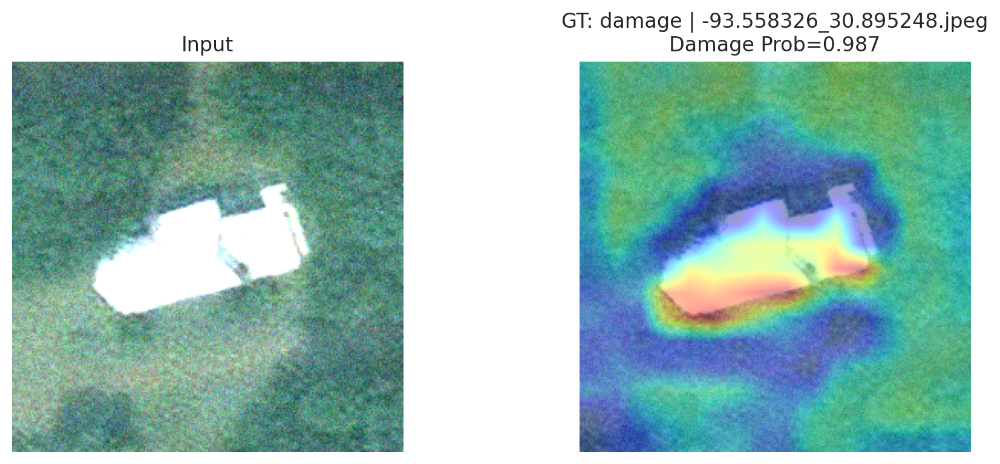

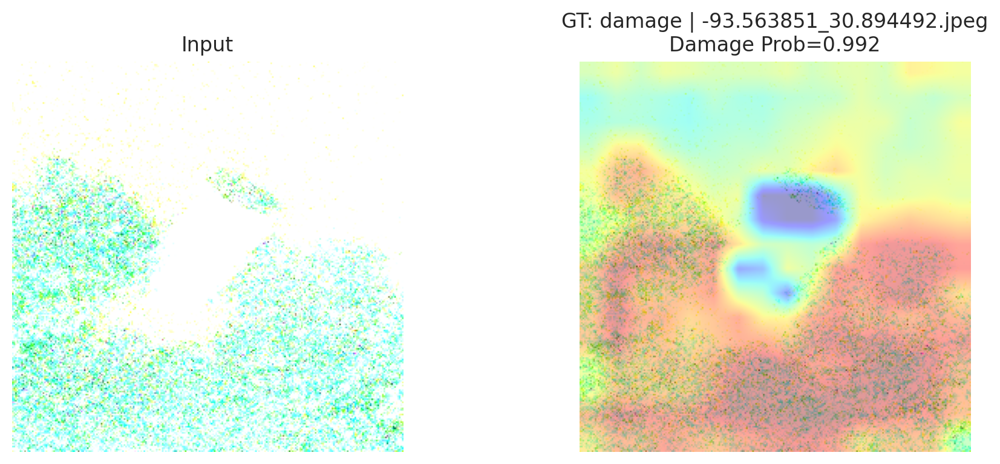

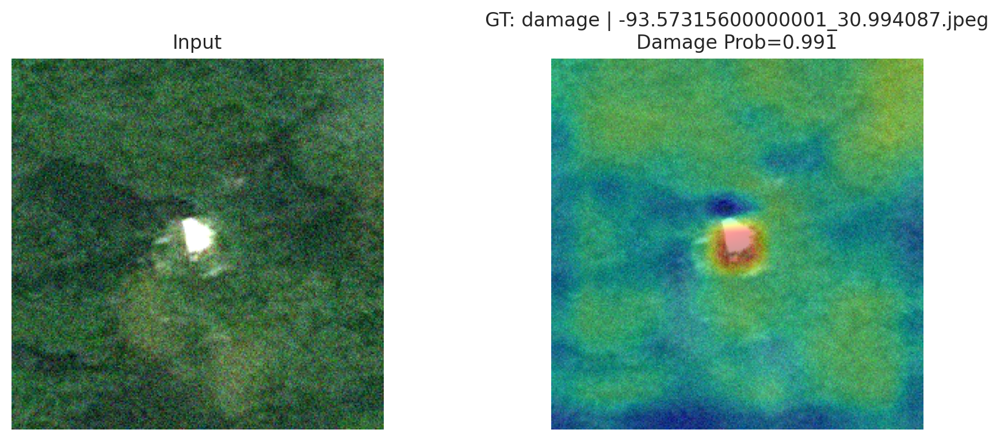

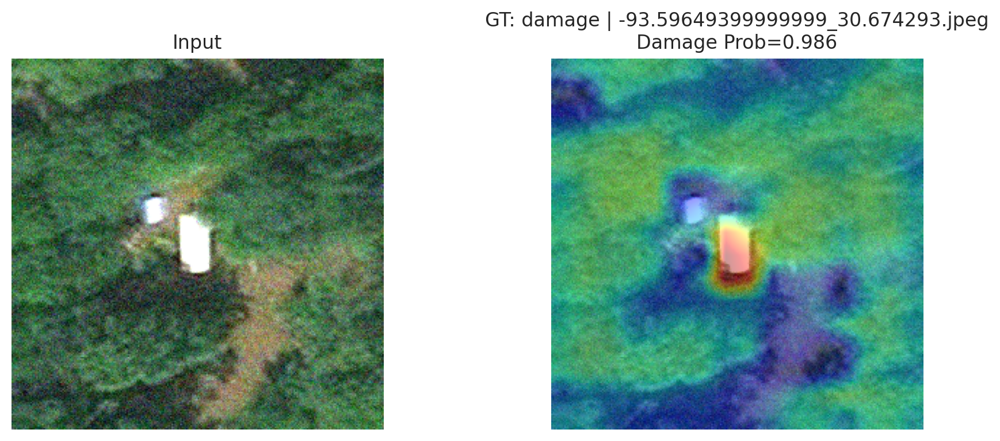

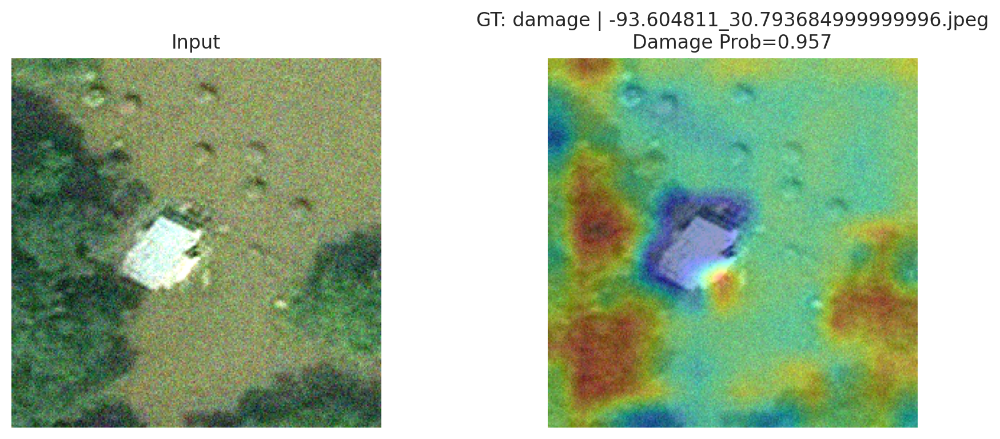

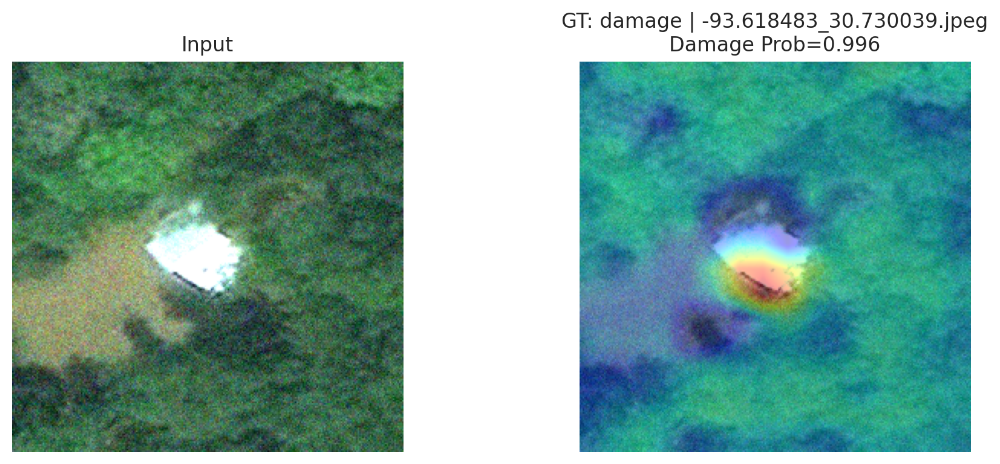

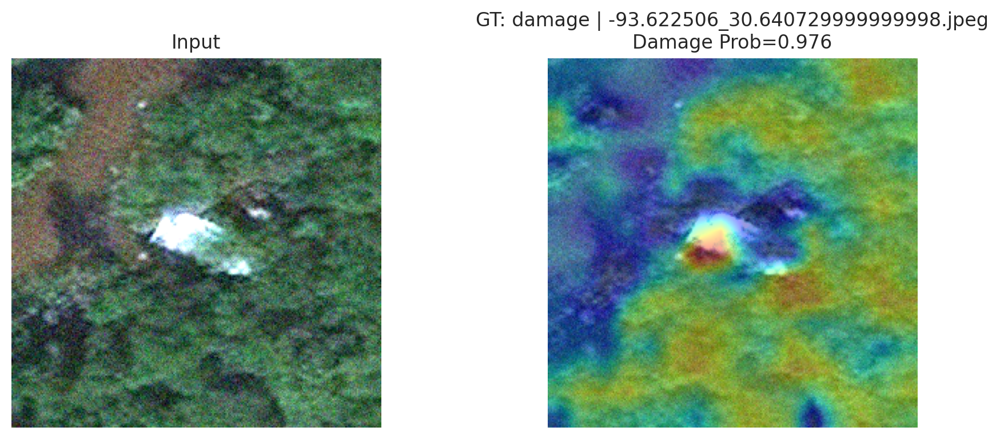

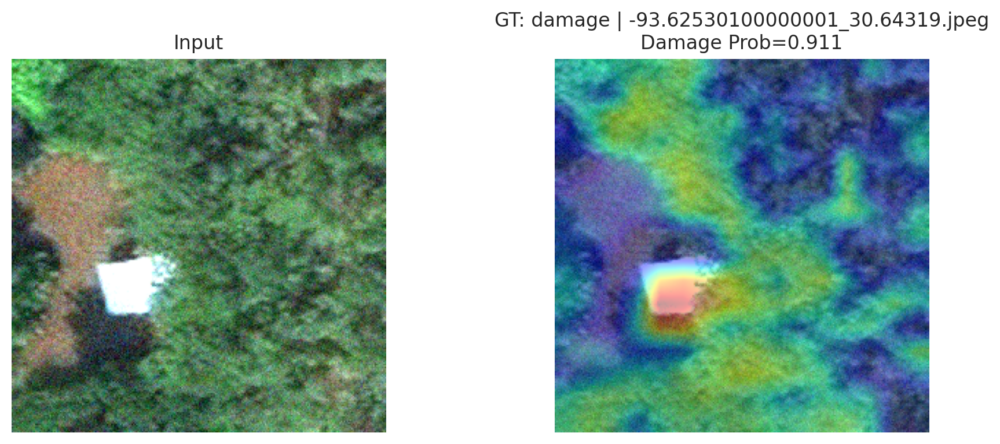

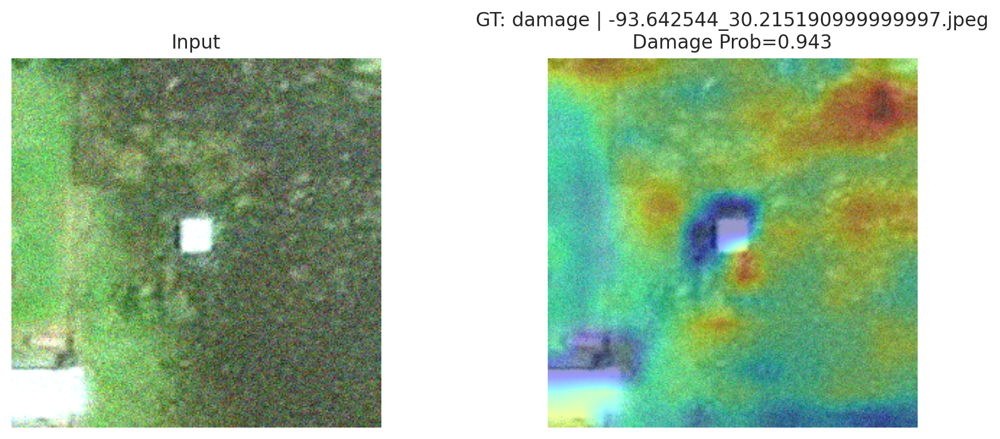

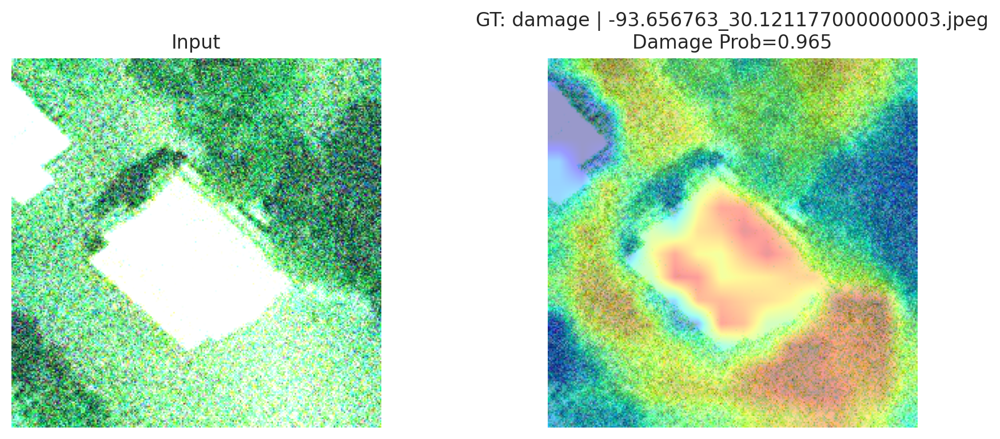

In [25]:
import matplotlib.pyplot as plt

# Visualize with Grad-CAM on multiple samples and save to detector_plots
PLOTS_DIR = PROJECT_ROOT / "detector_plots"
PLOTS_DIR.mkdir(parents=True, exist_ok=True)

eval_tfm = make_eval_transform(base_cfg)
base_model = load_model_from_ckpt(base_cfg, base_ckpt)

def pick_samples(split_root: Path, max_samples: int = 3):
    samples = []
    if not split_root.exists():
        return samples
    for label_dir in sorted(split_root.iterdir()):
        if not label_dir.is_dir():
            continue
        imgs = sorted(list(label_dir.glob("*.jpeg")) + list(label_dir.glob("*.jpg")))
        for img in imgs:
            samples.append(img)
            if len(samples) >= max_samples:
                return samples
    return samples

samples = pick_samples(DATA_ROOT / "validation", max_samples=10)

if not samples:
    print("No samples found in validation set.")
else:
    print("Using samples:", samples)
    for idx, sample_path in enumerate(samples):
        img_t = load_image_tensor(sample_path, eval_tfm)
        
        cam, probs = grad_cam_heatmap(base_model, img_t, class_idx=0)  # class 0 = damage
        label_name = sample_path.parent.name
        title_str = f"GT: {label_name} | {sample_path.name}\nDamage Prob={probs[0]:.3f}"
        show_cam_on_image(img_t, cam, title=title_str)
        fig = show_cam_on_image(img_t, cam, title=title_str)
        out_path = PLOTS_DIR / f"gradcam_base_{idx}.pdf"
        fig.savefig(out_path, bbox_inches="tight")
        print("Saved", out_path)
        plt.close(fig)

- **Observation 1**: Multiple heatmaps show intense red/orange "hotspots" in the empty field, completely disconnected from the building.
- *Interpretation*: A valid damage detector would have zero interest in empty grass. The fact that the model is activating strongly on the ground texture proves it is using global environmental cues (e.g., "this specific shade of green/brown grass only appears in the post-hurricane dataset") to make its decision. It is classifying the "scene," not the object.

- **Observation 2**: The heatmap is a diffuse "blob" that covers the entire building footprint or simply highlights the white pixels of the roof. It does not focus on specific edges, holes, or debris.
- *Interpretation*: The model has likely learned a simple rule: "Bright white object + Post-event lighting conditions = Damage." In the last image the roof appears structurally intact (straight edges, square shape). A real damage detector would likely be unsure or focus on the margins. The model is 96.5% confident it is damaged, likely because the image's noise profile and color histogram match the "Post-Event" domain perfectly.


If this model were truly detecting damage, the Grad-CAM would highlight high-frequency structural features like:
- Jagged edges of a collapsed roof.
- Piles of debris on the lawn.
- Texture irregularities.

Instead, the Grad-CAMs show low-frequency, diffuse activations (blobs and background noise). This confirms the model is exploiting the temporal domain shift (lighting, sensor noise, atmospheric haze) discussed.

## Compare performance: baseline vs shuffled


In [9]:
print('Baseline test metrics:', base_test_metrics)
print('Shuffled test metrics:', shuffle_test_metrics)

Baseline test metrics: {'accuracy': 0.83, 'macro_precision': 0.8302972675407867, 'macro_recall': 0.83, 'macro_f1': 0.8299617413918132, 'brier': 0.11844753707094009, 'ece': 0.027365809828043007}
Shuffled test metrics: {'accuracy': 0.7145, 'macro_precision': 0.7575898952707936, 'macro_recall': 0.7145, 'macro_f1': 0.7020392050656465, 'brier': 0.18873268318480915, 'ece': 0.13155298274755478}


Saved /home/tim/repos/ipeo-hurricane-damage-detection/detector_plots/metrics_comparison.pdf


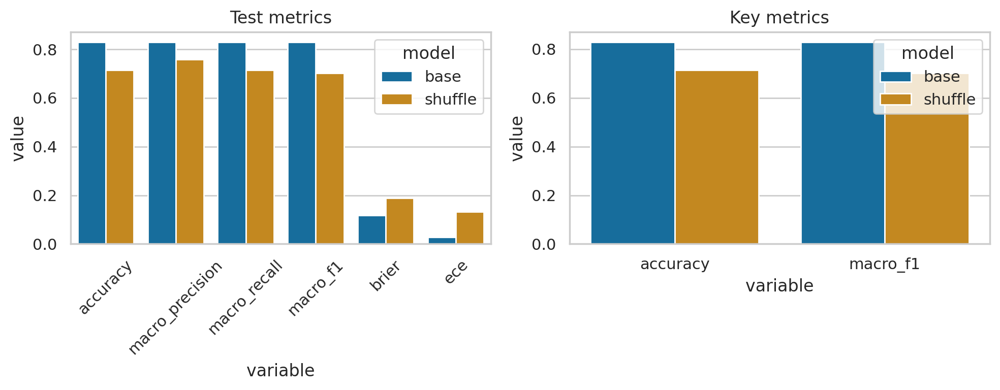

In [26]:
# comparison of metrics and logit biases
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

metrics_df = pd.DataFrame([
    {'model': 'base', **base_test_metrics},
    {'model': 'shuffle', **shuffle_test_metrics},
])
if not metrics_df.empty:
    fig, axes = plt.subplots(1, 2, figsize=(10, 4))
    sns.barplot(data=metrics_df.melt(id_vars='model'), x='variable', y='value', hue='model', ax=axes[0])
    axes[0].set_title('Test metrics')
    axes[0].tick_params(axis='x', rotation=45)
    # Focus on macro_f1 and accuracy if present
    focus_cols = [c for c in ['accuracy', 'macro_f1'] if c in metrics_df.columns]
    if focus_cols:
        sns.barplot(data=metrics_df[['model'] + focus_cols].melt(id_vars='model'), x='variable', y='value', hue='model', ax=axes[1])
        axes[1].set_title('Key metrics')
        axes[1].tick_params(axis='x', rotation=0)
    plt.tight_layout()
    out_path = PLOTS_DIR / 'metrics_comparison.pdf'
    fig.savefig(out_path, bbox_inches='tight')
    print('Saved', out_path)
    plt.show()
else:
    print('No metrics to plot.')

- **Observation**: The "Shuffle" model (orange bars), which was trained on images with completely destroyed spatial structure (randomly shuffled pixels), still achieves >70% Accuracy and F1 Score.

- *Implication*: A valid damage detector relies on structural features like holes in roofs, debris piles, or jagged edges. If pixels are shuffled, these features disappear, and a structural model's accuracy should drop to random guessing (~50%).

- **Conclusion**: The fact that the model maintains relatively high performance without seeing any shapes proves it is relying most likely entirely on global color statistics (histograms). It has learned that specific color distributions (e.g., "gloomier lighting," "hazy atmosphere," or "specific sensor calibration") correlate with the "Damage" label, because all "Damage" labels come from the Post-Event domain.

## Side-by-side 3D split stacks (raw data)


/home/tim/repos/ipeo-hurricane-damage-detection/src/eda/runbook_utils.py:822: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


Saved figure to eda_plots/eda_compare_split_stack_3d_side_by_side.pdf


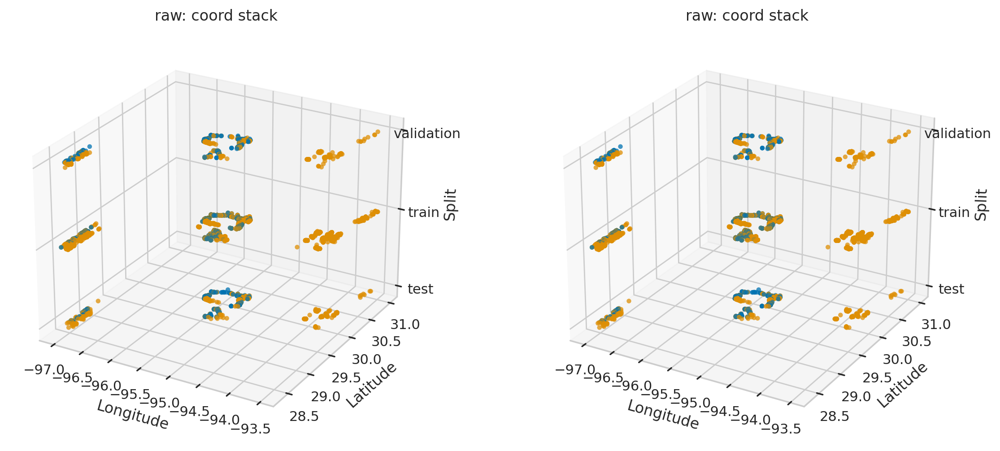

In [11]:
# Quick 3D visualization of coord vs split vs label (raw)
from eda.runbook_utils import RunbookContext, load_image_dataframe, plot_split_stack_3d_pair

viz_ctx = RunbookContext(
    project_root=PROJECT_ROOT,
    plots_dir=PROJECT_ROOT / 'eda_plots',
    include_splits=['train', 'validation', 'test'],
    roundings=[6,5,4,3],
    merge_distance_m=50.0,
    stat_sample_size=None,
    size_sample_size=None,
    split_stat_sample_size=None,
    duplicate_sample=None,
    quality_sample_size=None,
    photo_sample_size=None,
    grid_samples=9,
    seed=SEED,
    label_palette={'damage': '#de8f05', 'no_damage': '#0173b2'},
)
raw_df = load_image_dataframe(viz_ctx, DATA_ROOT)
resampled_df = load_image_dataframe(viz_ctx, DATA_ROOT)
plot_split_stack_3d_pair(viz_ctx, raw_df, resampled_df, 'raw', 'raw')